In [1]:
#!curl -L "https://app.roboflow.com/ds/p7Ioi9anrq?key=qRq1XtcNJa" > roboflow.zip; unzip roboflow.zip; rm roboflow.zip
!curl -L "https://app.roboflow.com/ds/GF7SQ2aHH3?key=sp03rs8Tg2" > roboflow.zip; unzip roboflow.zip; rm roboflow.zip

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100   910  100   910    0     0   1998      0 --:--:-- --:--:-- --:--:--  1995
100 42.2M  100 42.2M    0     0  21.1M      0  0:00:02  0:00:02 --:--:-- 50.3M
Archive:  roboflow.zip
  inflating: README.dataset.txt      
  inflating: README.roboflow.txt     
  inflating: data.yaml               
   creating: test/
   creating: test/images/
 extracting: test/images/7_png.rf.c3ad727e6c8087be9b3e410cfcaaccc6.jpg  
 extracting: test/images/IMG-20241003-WA0040_jpg.rf.070755027c126f6ce4f61e2601499acb.jpg  
 extracting: test/images/IMG-20241003-WA0045_jpg.rf.d848e58e930b12de7f69ad71f300ad1d.jpg  
 extracting: test/images/IMG-20241003-WA0047_jpg.rf.c9c3d9b7be648360a44418275c6fcf4a.jpg  
 extracting: test/images/IMG-20241003-WA0064_jpg.rf.6d7d4bf0cc303861637635bcf349510a.jpg  
 extracting: test/images/IMG_1665_JPEG.rf.991dbd0c94054088b5be243

In [2]:
!git clone https://github.com/ultralytics/yolov5.git
%cd yolov5
!pip install -r requirements.txt

Cloning into 'yolov5'...
remote: Enumerating objects: 17067, done.
remote: Counting objects: 100% (45/45), done.
remote: Compressing objects: 100% (33/33), done.
remote: Total 17067 (delta 24), reused 28 (delta 12), pack-reused 17022 (from 1)
Receiving objects: 100% (17067/17067), 15.68 MiB | 7.73 MiB/s, done.
Resolving deltas: 100% (11714/11714), done.
/content/yolov5
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 896.9/896.9 kB 24.4 MB/s eta 0:00:00


In [3]:
class Config:
    #dataset params
    #DATA_DIR = '/content/'
    TRAIN_IMAGES_DIR = '/content/train/images'
    TRAIN_LABELS_DIR = '/content/train/labels'
    VAL_IMAGES_DIR = '/content/valid/images'
    VAL_LABELS_DIR = '/content//valid/labels'
    TEST_IMAGES_DIR = '/content/test/images'
    TEST_LABELS_DIR = '/content/test/labels'
    CLASSES = ['free_parking_space', 'not_free_parking_space', 'partially_free_parking_space','person']
    NUM_CLASSES = len(CLASSES)
    DATALOADER_PARAMS = {
        'batch_size': 8,
        'num_workers': 2
    }
config = Config()

In [4]:
import os
import torch
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from PIL import Image
class ParkingDataset(Dataset):
    def __init__(self, images_dir, labels_dir, classes, transform=None):
        self.images_dir = images_dir
        self.labels_dir = labels_dir
        self.classes = classes
        self.transform = transform
        self.image_files = [f for f in os.listdir(images_dir) if os.path.isfile(os.path.join(images_dir, f))]

    def __len__(self):
        return len(self.image_files)

    def __getitem__(self, idx):
        img_name = os.path.join(self.images_dir, self.image_files[idx])
        image = Image.open(img_name).convert("RGB")

        label_name = os.path.join(self.labels_dir, self.image_files[idx].replace('.jpg', '.txt'))
        label = self.read_label(label_name)

        if self.transform:
            image = self.transform(image)

        return image, label

    def read_label(self, label_path):
      with open(label_path, 'r') as file:
        labels = []
        for line in file:
            parts = line.strip().split()

            if len(parts) >= 5:  # Ensure there are at least 5 elements
                class_id = int(parts[0])  # Class ID
                bbox = [float(x) for x in parts[1:5]]  # First four elements as bbox
                labels.append([class_id] + bbox)

        # Ensure labels have a consistent length (class_id + 4 bbox coordinates)
        if len(labels) > 0:
            return torch.tensor(labels)
        else:
            return torch.tensor([])  # Return an empty tensor if no valid labels


##transformations if needed

In [5]:
# train_transform = transforms.Compose([
#     transforms.Resize((256, 256)),
#     transforms.RandomHorizontalFlip(),
#     transforms.ToTensor(),
# ])

# val_transform = transforms.Compose([
#     transforms.Resize((256, 256)),
#     transforms.ToTensor(),
# ])

# test_transform = transforms.Compose([
#     transforms.Resize((256, 256)),
#     transforms.ToTensor(),
# ])
transform = transforms.Compose([
    transforms.Resize((224,224)),
    transforms.ToTensor()  # Convert images to tensors
])

#creating data loaders

In [6]:
# Initialize datasets
train_dataset = ParkingDataset(config.TRAIN_IMAGES_DIR, config.TRAIN_LABELS_DIR, config.CLASSES,transform=transform)
val_dataset = ParkingDataset(config.VAL_IMAGES_DIR, config.VAL_LABELS_DIR, config.CLASSES,transform=transform)
test_dataset = ParkingDataset(config.TEST_IMAGES_DIR, config.TEST_LABELS_DIR, config.CLASSES,transform=transform)

# Initialize dataloaders
train_loader = DataLoader(dataset=train_dataset, batch_size=config.DATALOADER_PARAMS['batch_size'], shuffle=True, num_workers=config.DATALOADER_PARAMS['num_workers'])
val_loader = DataLoader(dataset=val_dataset, batch_size=config.DATALOADER_PARAMS['batch_size'], shuffle=False, num_workers=config.DATALOADER_PARAMS['num_workers'])
test_loader = DataLoader(dataset=test_dataset, batch_size=config.DATALOADER_PARAMS['batch_size'], shuffle=False, num_workers=config.DATALOADER_PARAMS['num_workers'])


In [7]:
from torch.utils.data.dataloader import default_collate

def collate_fn(batch):
    images, labels = zip(*batch)

    # Stack the images (they should be tensors now)
    images = torch.stack(images, 0)

    # For labels, you may need to pad or handle them as per your dataset
    # Example: pad labels to a fixed size
    max_labels = max([label.size(0) for label in labels])  # Find the maximum number of labels
    padded_labels = []
    for label in labels:
        # Pad each label to the max size with a padding value (e.g., -1)
        padding = torch.full((max_labels - label.size(0), label.size(1)), -1)
        padded_labels.append(torch.cat((label, padding), 0))

    # Stack the labels
    labels = torch.stack(padded_labels, 0)

    return images, labels

# Create dataset and DataLoader with custom collate function
train_loader = torch.utils.data.DataLoader(
    train_dataset,
    batch_size=config.DATALOADER_PARAMS['batch_size'],
    num_workers=config.DATALOADER_PARAMS['num_workers'],
    collate_fn=collate_fn  # Use custom collate function
)


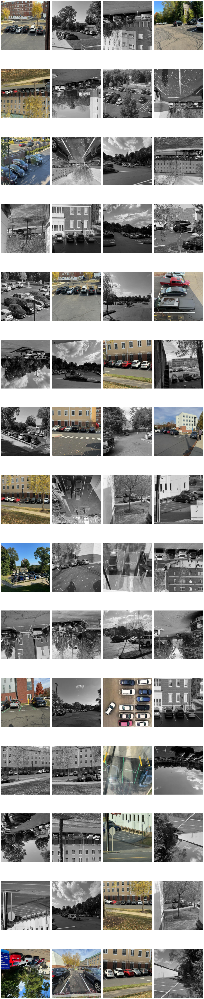

In [8]:
import matplotlib.pyplot as plt
import torchvision
%matplotlib inline
#from yolov5.utils.plots import plot_images
# img=torchvision.io.read_image("/content/test/images/IMG-20241003-WA0040_jpg.rf.070755027c126f6ce4f61e2601499acb.jpg")
# print(torchvision.__version__)
# img.shape
# img.permute((1,2,0)).shape
# plt.imshow(img.permute((1,2,0)))
import matplotlib.pyplot as plt

# Set the number of columns for the grid
num_columns = 4  # Adjust the number of columns as needed

# Get the number of batches and calculate the number of rows
num_batches = len(train_loader)
num_rows = (num_batches + num_columns - 1) // num_columns  # Ceiling division to get rows

# Create a figure to hold the grid of images
fig, axes = plt.subplots(num_rows, num_columns, figsize=(15, 5 * num_rows))
axes = axes.flatten()  # Flatten the axes for easy iteration

# Iterate through the DataLoader and get each batch
image_idx = 0
for images, labels in train_loader:
    # Select the first image in the batch
    first_image = images[0].permute(1, 2, 0)  # Change shape from (C, H, W) to (H, W, C)

    # Plot the first image in the current subplot
    ax = axes[image_idx]
    ax.imshow(first_image)
    ax.axis('off')  # Turn off the axis

    # Optionally print the labels of the first image (uncomment if needed)
    # ax.set_title(f"Label: {labels[0]}")  # Display label as title (if appropriate)

    image_idx += 1
    if image_idx >= num_batches:
        break  # Exit after displaying all images

# Remove any extra subplots if there are fewer images than grid slots
for i in range(image_idx, len(axes)):
    axes[i].axis('off')  # Hide unused subplots

plt.tight_layout()
plt.show()





In [9]:
import torch
from pathlib import Path

yolov5_repo_path = Path('/content/yolov5')

# Change the working directory to the YOLOv5 repository
%cd {yolov5_repo_path}

# Load the pre-trained YOLOv5 model
model = torch.hub.load('ultralytics/yolov5', 'yolov5s', pretrained=True)
num_classes = 4  # Your number of classes
model.nc = num_classes  # Set the number of classes to match your dataset
model.names = ['person','free_parking_space', 'not_free_parking_space', 'partially_free_parking_space']
!python train.py --img 640 --batch 8 --epochs 10 --data '/content/data.yaml' --weights 'yolov5s.pt' --cache

/content/yolov5


/usr/local/lib/python3.10/dist-packages/torch/hub.py:330: UserWarning: You are about to download and run code from an untrusted repository. In a future release, this won't be allowed. To add the repository to your trusted list, change the command to {calling_fn}(..., trust_repo=False) and a command prompt will appear asking for an explicit confirmation of trust, or load(..., trust_repo=True), which will assume that the prompt is to be answered with 'yes'. You can also use load(..., trust_repo='check') which will only prompt for confirmation if the repo is not already trusted. This will eventually be the default behaviour
  warnings.warn(
Downloading: "https://github.com/ultralytics/yolov5/zipball/master" to /root/.cache/torch/hub/master.zip


Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


YOLOv5 🚀 2024-12-1 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)

100%|██████████| 14.1M/14.1M [00:00<00:00, 176MB/s]

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients, 16.4 GFLOPs
Adding AutoShape... 


wandb: WARNING ⚠️ wandb is deprecated and will be removed in a future release. See supported integrations at https://github.com/ultralytics/yolov5#integrations.
2024-12-01 21:18:42.644955: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-12-01 21:18:42.663759: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-12-01 21:18:42.669488: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
wandb: Using wandb-core as the SDK backend.  Please refer to https://wandb.me/wandb-core for more information.
wandb: (1) Create a W&B account
wandb: (2) Use an existing W&B account
wandb: (3) Don't visua

In [10]:
model

AutoShape(
  (model): DetectMultiBackend(
    (model): DetectionModel(
      (model): Sequential(
        (0): Conv(
          (conv): Conv2d(3, 32, kernel_size=(6, 6), stride=(2, 2), padding=(2, 2))
          (act): SiLU(inplace=True)
        )
        (1): Conv(
          (conv): Conv2d(32, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
          (act): SiLU(inplace=True)
        )
        (2): C3(
          (cv1): Conv(
            (conv): Conv2d(64, 32, kernel_size=(1, 1), stride=(1, 1))
            (act): SiLU(inplace=True)
          )
          (cv2): Conv(
            (conv): Conv2d(64, 32, kernel_size=(1, 1), stride=(1, 1))
            (act): SiLU(inplace=True)
          )
          (cv3): Conv(
            (conv): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1))
            (act): SiLU(inplace=True)
          )
          (m): Sequential(
            (0): Bottleneck(
              (cv1): Conv(
                (conv): Conv2d(32, 32, kernel_size=(1, 1), stride=(1, 1))
  

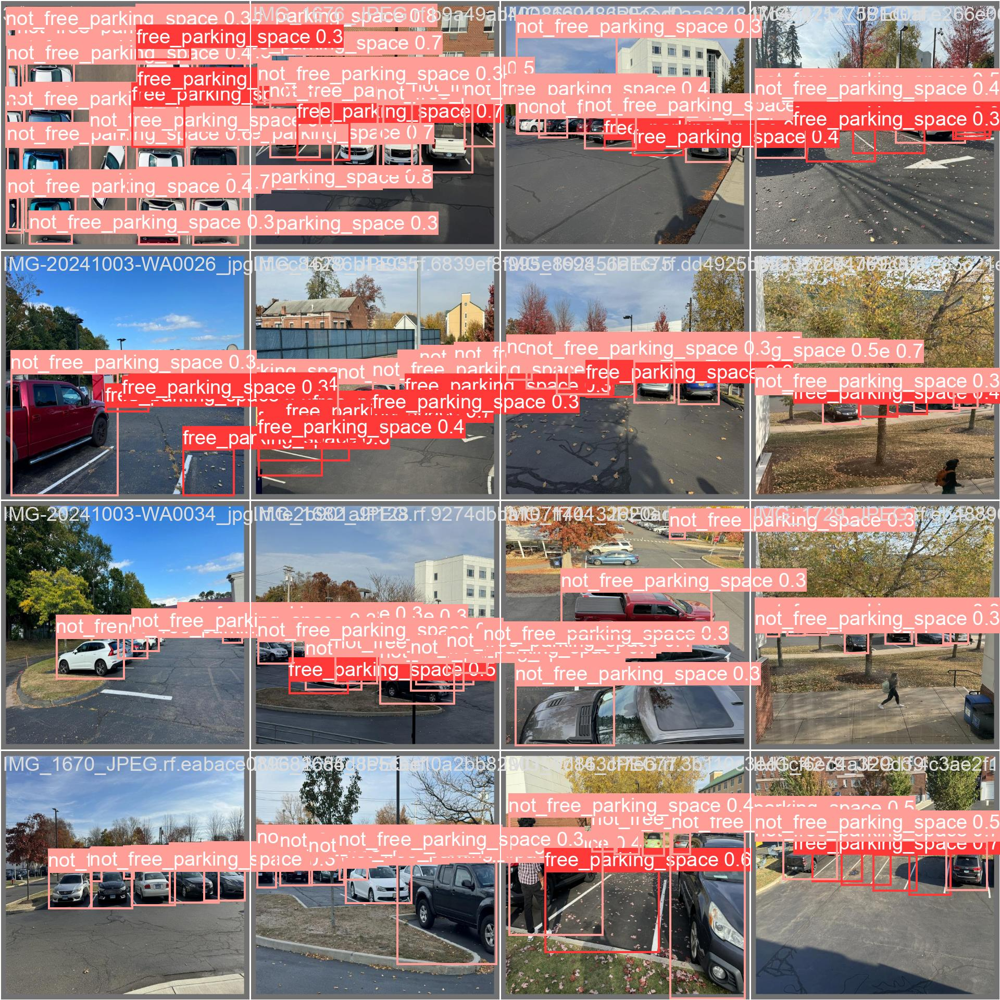

In [11]:
from IPython.display import Image

Image(filename='//content/yolov5/runs/train/exp/val_batch0_pred.jpg',width=900)

In [12]:
!python detect.py --weights '/content/yolov5/runs/train/exp/weights/best.pt' --img 416 --conf 0.4 --source '/content/test/images'

detect: weights=['/content/yolov5/runs/train/exp/weights/best.pt'], source=/content/test/images, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.4, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_format=0, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-388-g882c35fc Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
Model summary: 157 layers, 7020913 parameters, 0 gradients, 15.8 GFLOPs
WARNING ⚠️ NMS time limit 0.550s exceeded
image 1/20 /content/test/images/7_png.rf.c3ad727e6c8087be9b3e410cfcaaccc6.jpg: 416x416 17 free_parking_spaces, 12 not_free_parking_spaces, 6.9ms
image 2/20 /content/test/images/IMG-20241003-WA0040_jpg.rf.070755027c126f6ce4f61e2601499acb.jpg: 416x416 1 free

In [13]:
!python detect.py --weights runs/train/exp/weights/best.pt --img 640 --conf 0.25 --source '/content/test/images'


detect: weights=['runs/train/exp/weights/best.pt'], source=/content/test/images, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_format=0, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-388-g882c35fc Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
Model summary: 157 layers, 7020913 parameters, 0 gradients, 15.8 GFLOPs
WARNING ⚠️ NMS time limit 0.550s exceeded
image 1/20 /content/test/images/7_png.rf.c3ad727e6c8087be9b3e410cfcaaccc6.jpg: 640x640 8 free_parking_spaces, 21 not_free_parking_spaces, 11.2ms
image 2/20 /content/test/images/IMG-20241003-WA0040_jpg.rf.070755027c126f6ce4f61e2601499acb.jpg: 640x640 6 free_parking_spaces

In [16]:
!python detect.py --weights runs/train/exp/weights/best.pt --img 640 --conf 0.25 --source '/content/6.png'

detect: weights=['runs/train/exp/weights/best.pt'], source=/content/6.png, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_format=0, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-388-g882c35fc Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
Model summary: 157 layers, 7020913 parameters, 0 gradients, 15.8 GFLOPs
WARNING ⚠️ NMS time limit 0.550s exceeded
image 1/1 /content/6.png: 384x640 12 free_parking_spaces, 17 not_free_parking_spaces, 43.9ms
Speed: 0.5ms pre-process, 43.9ms inference, 885.2ms NMS per image at shape (1, 3, 640, 640)
Results saved to runs/detect/exp4


In [15]:
!apt-get install tree  # Install the tree package
!tree


Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
The following NEW packages will be installed:
  tree
0 upgraded, 1 newly installed, 0 to remove and 49 not upgraded.
Need to get 47.9 kB of archives.
After this operation, 116 kB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu jammy/universe amd64 tree amd64 2.0.2-1 [47.9 kB]
Fetched 47.9 kB in 0s (108 kB/s)
Selecting previously unselected package tree.
(Reading database ... 123630 files and directories currently installed.)
Preparing to unpack .../tree_2.0.2-1_amd64.deb ...
Unpacking tree (2.0.2-1) ...
Setting up tree (2.0.2-1) ...
Processing triggers for man-db (2.10.2-1) ...
.
├── benchmarks.py
├── CITATION.cff
├── classify
│   ├── predict.py
│   ├── train.py
│   ├── tutorial.ipynb
│   └── val.py
├── CONTRIBUTING.md
├── data
│   ├── Argoverse.yaml
│   ├── coco128-seg.yaml
│   ├── coco128.yaml
│   ├── coco.yaml
│   ├── GlobalWheat2020.yaml
│   ├── hyps
│   │ 

##Deployment

In [17]:
!pip install gradio

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 57.1/57.1 MB 18.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 320.1/320.1 kB 27.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 94.9/94.9 kB 8.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.2/11.2 MB 119.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 73.2/73.2 kB 7.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 63.8/63.8 kB 6.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 130.2/130.2 kB 13.6 MB/s eta 0:00:00
  Attempting uninstall: markupsafe
    Found existing installation: MarkupSafe 3.0.2
    Uninstalling MarkupSafe-3.0.2:
      Successfully uninstalled MarkupSafe-3.0.2


Interface class has three core arguments:

fn: the function to wrap a user interface (UI) around
inputs: the Gradio component(s) to use for the input. The number of components should match the number of arguments in your function.
outputs: the Gradio component(s) to use for the output. The number of components should match the number of return values from your function.

In [25]:
import gradio as gr
import torch
from PIL import Image

# Load your YOLOv5 model
model = torch.hub.load('ultralytics/yolov5', 'custom', path='runs/train/exp/weights/best.pt')

# Define the function to get predictions and draw labels on the image
def predict(image):
    # Run inference
    results = model(image)
    # Draw results on the image
    results.render()
    # Convert to PIL image
    labeled_image = Image.fromarray(results.ims[0])
    return labeled_image

# Create the Gradio interface
demo = gr.Interface(
    fn=predict,
    inputs=gr.Image(type="pil"),
    outputs=gr.Image(type="pil"),
    live=True
)

# Launch the interface
demo.launch(share=True)


Using cache found in /root/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 2024-12-1 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
Model summary: 157 layers, 7020913 parameters, 0 gradients, 15.8 GFLOPs
Adding AutoShape... 


Colab notebook detected. To show errors in colab notebook, set debug=True in launch()
* Running on public URL: https://5aea9d59d48c560edc.gradio.live

This share link expires in 72 hours. For free permanent hosting and GPU upgrades, run `gradio deploy` from the terminal in the working directory to deploy to Hugging Face Spaces (https://huggingface.co/spaces)


In [32]:
import gradio as gr
import torch
from PIL import Image

# Load your YOLOv5 model
model = torch.hub.load('ultralytics/yolov5', 'custom', path='runs/train/exp/weights/best.pt')

# Define the function to get predictions, draw labels on the image, and count empty/non-empty/partially parked spaces
def predict(image):
    # Run inference
    results = model(image)
    # Draw results on the image
    results.render()
    # Convert to PIL image
    labeled_image = Image.fromarray(results.ims[0])

    # Get the predictions
    predictions = results.pandas().xyxy[0]  # Predictions as a pandas DataFrame

    # Count empty, non-empty, and partially parked spaces
    empty_spaces = sum(predictions['name'] == 'free_parking_space')
    non_empty_spaces = sum(predictions['name'] == 'not_free_parking_space')
    partially_parked_spaces = sum(predictions['name'] == 'partially_parked_space')
    persons=sum(predictions['name'] == 'person')
    return labeled_image, f"Empty Spaces: {empty_spaces}", f"Non-Empty Spaces: {non_empty_spaces}", f"Partially Parked Spaces: {partially_parked_spaces}",f"Partially Parked Spaces: {persons}"

# Create the Gradio interface
demo = gr.Interface(
    fn=predict,
    inputs=gr.Image(type="pil"),
    outputs=[
        gr.Image(type="pil"),
        gr.Textbox(label="Empty Spaces"),
        gr.Textbox(label="Non-Empty Spaces"),
        gr.Textbox(label="Partially Parked Spaces"),
        gr.Textbox(label="Persons")
    ],
    live=True
)

# Launch the interface
demo.launch(share=True)


Using cache found in /root/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 2024-12-1 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
Model summary: 157 layers, 7020913 parameters, 0 gradients, 15.8 GFLOPs
Adding AutoShape... 


Colab notebook detected. To show errors in colab notebook, set debug=True in launch()
* Running on public URL: https://c0afdc8a41e3b7c322.gradio.live

This share link expires in 72 hours. For free permanent hosting and GPU upgrades, run `gradio deploy` from the terminal in the working directory to deploy to Hugging Face Spaces (https://huggingface.co/spaces)
